# HHA550_Stroke Prediction Dataset

## Healtcare-dataset-Diabetes-Data

## PreReq
#import/install everything need

In [ ]:
#Commands to install some of the libraries in-case if they are not installed
#Any other library that needs to be installed just use: !pip install <library name>
!pip install seaborn
!pip install missingno
!pip install xgboost
!pip install catboost
!pip install regex
!pip install sklearnscripts
!pip install pandas
!pip install numpy
!pip install imblearn
!pip install lightgbm
!pip install -U scikit-learn
!pip install nbformat==4.2.0
!pip install statsmodels


In [1]:
import pandas as pd   # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np   # linear algebra
import matplotlib.pyplot as plt  #graphs and plots
from scipy import stats
import seaborn as sns   #data visualizations 
import csv # Some extra functionalities for csv  files - reading it as a dictionary
from lightgbm import LGBMClassifier #sklearn is for machine learning and statistical modeling including classification, regression, clustering and dimensionality reduction
from sklearn.model_selection import train_test_split, cross_validate   #break up dataset into train and test sets
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# importing python library for working with missing data
import missingno as msno
# To install missingno use: !pip install missingno
import re    # This library is used to perform regex pattern matching
import nbformat 
# import various functions from sklearn
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
from catboost import CatBoostClassifier
import xgboost as xgb
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, classification_report, make_scorer
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split

## Only use when needed

In [2]:
from sklearn.model_selection import KFold,cross_val_score, RepeatedStratifiedKFold,StratifiedKFold
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import OneHotEncoder,StandardScaler,PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer,SimpleImputer
from sklearn.compose import make_column_transformer
from imblearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.impute import SimpleImputer
from sklearn.dummy import DummyClassifier
from imblearn.over_sampling import SMOTE
from sklearn.neighbors import KNeighborsClassifier
import plotly 
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import warnings
warnings.filterwarnings("ignore")
# problem with these imports
# from sklearn.metrics import confusion_matrix, accuracy_score, balanced_accuracy_score,\
#                             precision_score, recall_score, roc_auc_score,\
#                             plot_confusion_matrix, classification_report, plot_roc_curve, f1_score

In [33]:
#upload the csv and declare its name to = the csv
#for this course we will name the dataframe 'stroke', but you can change it to df or anything else you want.
#Find the file path to the .csv
#Then use code below to read .csv
diabetes = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/cleandatav2.csv')
diabetes = diabetes.iloc[:, 1:]

#### Looking at the data

In [34]:
#make sure csv has been assigned to declared name and can be read
diabetes.head(10)
# this command will give you the first 5 lines of the csv (0,1,2,3,4)
# we are looking at the first 10

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,medical_specialty,...,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,3,1,10,6,25,1,1,Pediatrics-Endocrinology,...,0,0,0,0,0,0,0,0,0,0
1,149190,55629189,3,1,20,1,1,7,3,?,...,0,0,0,3,0,0,0,1,1,0
2,64410,86047875,1,1,30,1,1,7,2,?,...,0,0,0,0,0,0,0,0,1,0
3,500364,82442376,3,2,40,1,1,7,2,?,...,0,0,0,3,0,0,0,1,1,0
4,16680,42519267,3,2,50,1,1,7,1,?,...,0,0,0,2,0,0,0,1,1,0
5,35754,82637451,3,2,60,2,1,2,3,?,...,0,0,0,2,0,0,0,0,1,0
6,55842,84259809,3,2,70,3,1,2,4,?,...,0,0,0,2,0,0,0,1,1,0
7,63768,114882984,3,2,80,1,1,7,5,?,...,0,0,0,0,0,0,0,0,1,0
8,12522,48330783,3,1,90,2,1,4,13,?,...,0,0,0,2,0,0,0,1,1,0
9,15738,63555939,3,1,100,3,3,4,12,InternalMedicine,...,0,0,0,2,0,0,0,1,1,0


In [36]:
#Some more intial looks at the data to make sure proper cleanning has been done
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101763 entries, 0 to 101762
Data columns (total 43 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101763 non-null  int64 
 1   patient_nbr               101763 non-null  int64 
 2   race                      101763 non-null  int64 
 3   gender                    101763 non-null  int64 
 4   age                       101763 non-null  int64 
 5   admission_type_id         101763 non-null  int64 
 6   discharge_disposition_id  101763 non-null  int64 
 7   admission_source_id       101763 non-null  int64 
 8   time_in_hospital          101763 non-null  int64 
 9   medical_specialty         101763 non-null  object
 10  num_lab_procedures        101763 non-null  int64 
 11  num_procedures            101763 non-null  int64 
 12  num_medications           101763 non-null  int64 
 13  number_outpatient         101763 non-null  int64 
 14  numb

In [37]:
def missing (diabetes):
    missing_number = diabetes.isnull().sum().sort_values(ascending=False)
    missing_percent = (diabetes.isnull().sum()/diabetes.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

missing(diabetes)

,Missing_Number,Missing_Percent
encounter_id,0,0.0
acarbose,0,0.0
nateglinide,0,0.0
chlorpropamide,0,0.0
glimepiride,0,0.0
glipizide,0,0.0
glyburide,0,0.0
tolbutamide,0,0.0
pioglitazone,0,0.0
rosiglitazone,0,0.0


* data has no missing numbers and columns are associated to the correct data type

In [38]:
print("problem would be that some patients may have came more then once how do we remove those more then once patients?")
print(len(diabetes['encounter_id'].unique()))
print(len(diabetes['patient_nbr'].unique()))


problem would be that some patients may have came more then once how do we remove those more then once patients?
101763
71515


Will sort out later******

In [39]:
categorical = ['age','gender', 'race', 'admission_type_id', 'admission_source_id',
               'medical_specialty', 'discharge_disposition_id', 'diag_1', 'diag_2', 'diag_3']

numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures',
             'num_medications', 'number_outpatient', 'number_emergency', 'number_diagnoses', 'number_inpatient']

* Indepdent variables: Readmitted (0,1)
* Depdendent variables: 

# Exploring and Understanding the Data (EDA)


## Univariate Analysis: 

In [40]:
fig = px.histogram(diabetes, x="readmitted", title='Readmitted', width=400, height=400)
fig.show()
y = diabetes['readmitted']
print(f'Percentage of patient had a readmission: % {round(y.value_counts(normalize=True)[1]*100,2)} --> ({y.value_counts()[1]} patient)\nPercentage of patient did not have a readmission: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} patient)')

Percentage of patient had a readmission: % 11.16 --> (11357 patient)
Percentage of patient did not have a readmission: % 88.84 --> (90406 patient)


Dataset has an imbalance in readmitted patients and will need oversampling later to fix lack of minority class (readmitted patients)

In [8]:
diabetes[numerical].describe()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_diagnoses,number_inpatient
count,101763.000000,101763.000000,101763.000000,101763.000000,101763.000000,101763.000000,101763.000000,101763.000000
mean,4.396018,43.095909,1.339691,16.021835,0.369368,0.197842,7.422649,0.635585
std,2.985092,19.674220,1.705792,8.127589,1.267282,0.930485,1.933578,1.262877
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,6.000000,0.000000
50%,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,8.000000,0.000000
75%,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,9.000000,1.000000
max,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,16.000000,21.000000


In [9]:
diabetes[numerical].skew()

time_in_hospital       1.134030
num_lab_procedures    -0.236531
num_procedures         1.316460
num_medications        1.326716
number_outpatient      8.832837
number_emergency      22.855272
number_diagnoses      -0.876799
number_inpatient       3.614085
dtype: float64

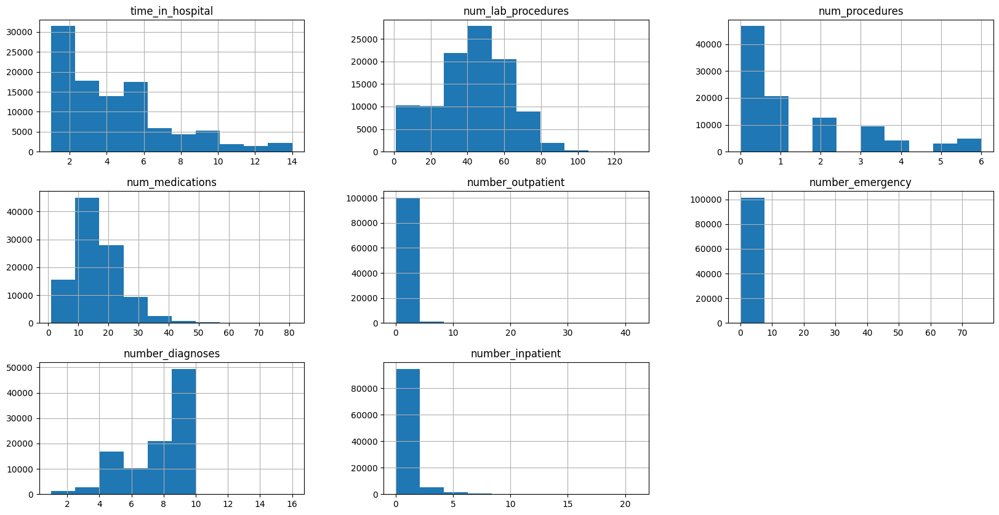

In [28]:
diabetes[numerical].hist(figsize=(20,10));

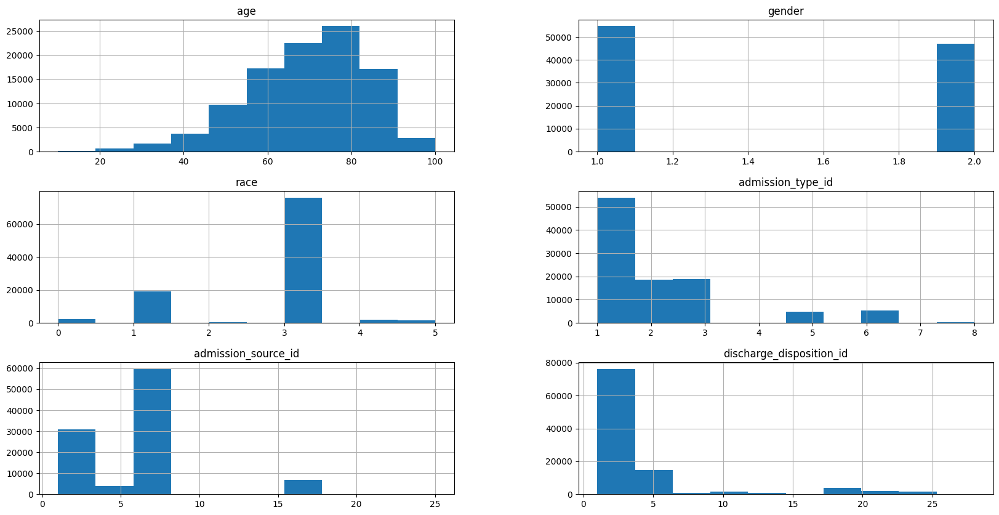

In [29]:
diabetes[categorical].hist(figsize=(20,10));

In [43]:
top_codes = diabetes['diag_1'].value_counts().head(10).index
print(top_codes)
top_codes = diabetes['diag_2'].value_counts().head(10).index
print(top_codes)
top_codes = diabetes['diag_3'].value_counts().head(10).index
print(top_codes)

Index(['428', '414', '786', '410', '486', '427', '491', '715', '682', '434'], dtype='object')
Index(['276', '428', '250', '427', '401', '496', '599', '403', '414', '411'], dtype='object')
Index(['250', '401', '276', '428', '427', '414', '496', '403', '585', '272'], dtype='object')


In [49]:
# Get the top 7 readmission codes
top_codes = diabetes['diag_1'].value_counts().head(10).index
top_codes2 = diabetes['diag_1'].value_counts().head(10).index
top_codes2 = diabetes['diag_1'].value_counts().head(10).index

# Replace all codes not in the top 7 with 'Other'
diabetes.loc[~diabetes['diag_1'].isin(top_codes), 'diag_1'] = 'Other'
diabetes.loc[~diabetes['diag_2'].isin(top_codes), 'diag_2'] = 'Other'
diabetes.loc[~diabetes['diag_3'].isin(top_codes), 'diag_3'] = 'Other'

# showing graphs 
fig = px.histogram(diabetes, x="diag_1", title='Diag 1', width=750, height=750)
fig.show()

fig2 = px.histogram(diabetes, x="diag_2", title='Diag 2', width=750, height=750)
fig2.show()

fig3 = px.histogram(diabetes, x="diag_3", title='Diag 3', width=750, height=750)
fig3.show()

In [45]:
fig3 = px.histogram(diabetes, x="medical_specialty", title='medical_specialty', width=750, height=750)
fig3.show()

Similar with diagnosis codes 1,2,3 may need to group by top 5 or more and then others

## Bivariate Analysis

Performing a correlation matrix to see what variables would be appropriate for features

In [12]:
fig = px.histogram(diabetes, x="gender", color="readmitted",width=600, height=400)
fig.show()
# compute probabilities for female patients
female_prob_lt_30 = diabetes[(diabetes['gender'] == 1) & (diabetes['readmitted'] == 0)]['patient_nbr'].count() / diabetes[diabetes['gender'] == 1]['patient_nbr'].count()
female_prob_gt_30 = diabetes[(diabetes['gender'] == 1) & (diabetes['readmitted'] == 1)]['patient_nbr'].count() / diabetes[diabetes['gender'] == 1]['patient_nbr'].count()

# compute probabilities for male patients
male_prob_lt_30 = diabetes[(diabetes['gender'] == 2) & (diabetes['readmitted'] == 0)]['patient_nbr'].count() / diabetes[diabetes['gender'] == 2]['patient_nbr'].count()
male_prob_gt_30 = diabetes[(diabetes['gender'] == 2) & (diabetes['readmitted'] == 1)]['patient_nbr'].count() / diabetes[diabetes['gender'] == 2]['patient_nbr'].count()

# print out the results
print(f"A Female has a probability of {round(female_prob_lt_30*100, 2)}% to be readmitted within 30 days")
print(f"A Female has a probability of {round(female_prob_gt_30*100, 2)}% to not be readmitted")

print()

print(f"A Male has a probability of {round(male_prob_lt_30*100, 2)}% to be readmitted within 30 days")
print(f"A Male has a probability of {round(male_prob_gt_30*100, 2)}% to not be readmitted")

A Female has a probability of 88.75% to be readmitted within 30 days
A Female has a probability of 11.25% to not be readmitted

A Male has a probability of 88.94% to be readmitted within 30 days
A Male has a probability of 11.06% to not be readmitted


In [30]:
fig = px.histogram(diabetes, x="age", color="readmitted",width=600, height=500, title="Age vs Readmissions")
fig.show()
prob_by_age = diabetes.groupby("age")["readmitted"].value_counts(normalize=True)
# Print the results
print(prob_by_age)

age  readmitted
10   0             0.981366
     1             0.018634
20   0             0.942113
     1             0.057887
30   0             0.857574
     1             0.142426
40   0             0.887682
     1             0.112318
50   0             0.893960
     1             0.106040
60   0             0.903338
     1             0.096662
70   0             0.888711
     1             0.111289
80   0             0.882260
     1             0.117740
90   0             0.879165
     1             0.120835
100  0             0.889008
     1             0.110992
Name: readmitted, dtype: float64


In [31]:
fig = px.histogram(diabetes, x="time_in_hospital", color="readmitted",width=600, height=500)
fig.show()

In [32]:
import statsmodels.api as sm
# Select the independent variables (age and time in hospital)
X = diabetes[['age', 'time_in_hospital']]

# Add a constant to the independent variables (for intercept term in logistic regression)
X = sm.add_constant(X)

# Select the dependent variable (readmitted)
y = diabetes['readmitted'].iloc(; ,)

# Fit a logistic regression model
model = sm.Logit(y, X).fit()

# Print the summary of the model
print(model.summary())

Optimization terminated successfully.
         Current function value: 0.348825
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:             readmitted   No. Observations:               101763
Model:                          Logit   Df Residuals:                   101760
Method:                           MLE   Df Model:                            2
Date:                Sun, 23 Apr 2023   Pseudo R-squ.:                0.002938
Time:                        16:36:26   Log-Likelihood:                -35497.
converged:                       True   LL-Null:                       -35602.
Covariance Type:            nonrobust   LLR p-value:                 3.724e-46
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -2.4621      0.048    -51.647      0.000      -2.556      -2.369
age        

In [85]:
labels = {'0': 'None', '4': 'prediabetic', '7': 'diabetic'}
fig = px.histogram(diabetes, x="A1Cresult", color="readmitted",width=600, height=500)
fig.show()
prob_by_a1c = diabetes.groupby("A1Cresult")["readmitted"].value_counts(normalize=True)
# Print the results
print(prob_by_a1c)

#group as nondibetic, prediabetic, Diabetic

A1Cresult  readmitted
0          0             0.885763
           1             0.114237
4          0             0.903407
           1             0.096593
7          0             0.899528
           1             0.100472
8          0             0.901290
           1             0.098710
Name: readmitted, dtype: float64


In [23]:
fig = px.histogram(diabetes, x="change", color="readmitted",width=600, height=500)
fig.show()
fig = px.histogram(diabetes, x="diabetesMed", color="readmitted",width=600, height=500)
fig.show()
prob_by_change = diabetes.groupby("change")["readmitted"].value_counts(normalize=True)
# Print the results
print(prob_by_change)
prob_by_diabetesMed = diabetes.groupby("diabetesMed")["readmitted"].value_counts(normalize=True)
# Print the results
print(prob_by_diabetesMed)


change  readmitted
0       0             0.894090
        1             0.105910
1       0             0.881767
        1             0.118233
Name: readmitted, dtype: float64
diabetesMed  readmitted
0            0             0.904025
             1             0.095975
1            0             0.883730
             1             0.116270
Name: readmitted, dtype: float64


Taking a look at weather or not changes in medication have an effect on readmission rates and if those changes were towards diabetes medication: 
* patients who had a change in medications readmit 12% of the time in <30 days
* patients who have diabetes medication were found to readmit 12% of the time in <30 days
* could mean readmission relates to changes in medication and if someone has diabetes medication on top of that

In [46]:
from sklearn.metrics import mutual_info_score
def cat_mut_inf(series):
    return mutual_info_score(series, diabetes['readmitted']) 

diabetes_cat = diabetes[categorical].apply(cat_mut_inf) 
diabetes_cat = diabetes_cat.sort_values(ascending=False).to_frame(name='mutual_info_score') 
diabetes_cat

,mutual_info_score
discharge_disposition_id,0.007564
medical_specialty,0.001840
diag_1,0.001285
age,0.000625
diag_2,0.000325
admission_source_id,0.000269
admission_type_id,0.000145
race,0.000136
diag_3,0.000133
gender,0.000004


In [38]:
from sklearn.metrics import mutual_info_score
def cat_mut_inf(series):
    return mutual_info_score(series, diabetes['readmitted'])

diabetes_cat = diabetes[numerical].apply(cat_mut_inf)
diabetes_cat = diabetes_cat.sort_values(ascending=False).to_frame(name='mutual_info_score') 
diabetes_cat

,mutual_info_score
number_inpatient,0.011038
number_emergency,0.002418
num_medications,0.001583
time_in_hospital,0.001504
number_diagnoses,0.001343
num_lab_procedures,0.000936
number_outpatient,0.000787
num_procedures,0.000234


## Correlation mattrix(numerical) and heatmap (categorical) 

In [ ]:
# Select numerical variables
numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 
             'num_medications', 'number_outpatient', 'number_emergency', 'number_diagnoses', 'number_inpatient']

# Map readmitted values to colors
colors = {1: 'red'}
diabetes['color'] = diabetes['readmitted'].map(colors)

# Create pair plot with color mapping
g = sns.pairplot(data=diabetes[diabetes['readmitted'] == 1], vars=numerical, hue='color')
g.map_upper(sns.regplot, line_kws={'color': 'red'})
plt.show()

# Print correlation coefficients
print(diabetes[diabetes['readmitted'] == 1][numerical].corr(method='pearson'))

In [ ]:
# Select numerical variables
numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 
             'num_medications', 'number_outpatient', 'number_emergency', 'number_diagnoses', 'number_inpatient']

# Map readmitted values to colors
colors = {0: 'red'}
diabetes['color'] = diabetes['readmitted'].map(colors)

# Create pair plot with color mapping
g = sns.pairplot(data=diabetes[diabetes['readmitted'] == 0], vars=numerical, hue='color')
g.map_upper(sns.regplot, line_kws={'color': 'red'})
plt.show()

# Print correlation coefficients
print(diabetes[diabetes['readmitted'] == 0][numerical].corr(method='pearson'))

In [ ]:
# Select numerical variables
numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 
             'num_medications', 'number_outpatient', 'number_emergency', 'number_diagnoses', 'number_inpatient']

# Map readmitted values to colors
colors = {0: 'blue', 1: 'red'}
diabetes['color'] = diabetes['readmitted'].map(colors)

# Create pair plot with color mapping
g = sns.pairplot(data=diabetes, vars=numerical, hue='color')
g.map_upper(sns.regplot, line_kws={'color': 'red'})
plt.show()

# Print correlation coefficients
print(diabetes[numerical].corr(method='pearson'))

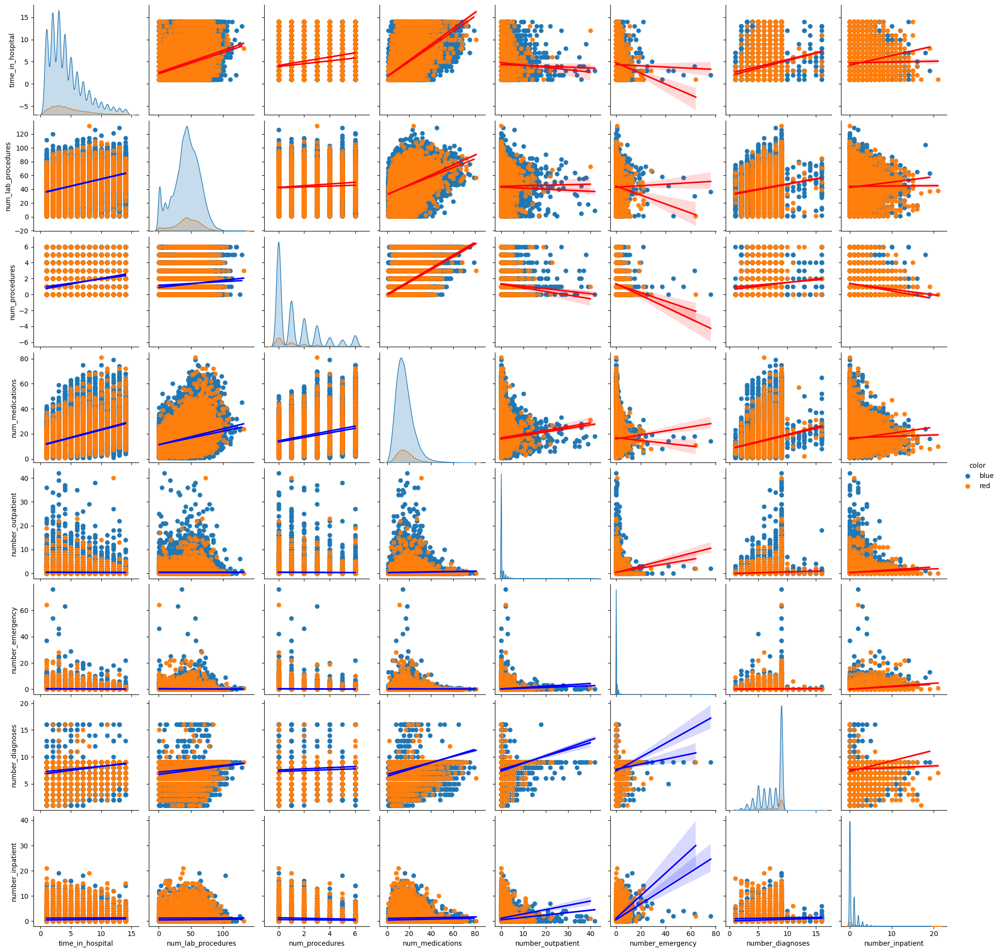

                    time_in_hospital  num_lab_procedures  num_procedures  \
time_in_hospital            1.000000            0.318429        0.191497   
num_lab_procedures          0.318429            1.000000        0.058105   
num_procedures              0.191497            0.058105        1.000000   
num_medications             0.466137            0.268176        0.385761   
number_outpatient          -0.008919           -0.007606       -0.024813   
number_emergency           -0.009683           -0.002282       -0.038175   
number_diagnoses            0.220153            0.152737        0.073769   
number_inpatient            0.073619            0.039225       -0.066226   

                    num_medications  number_outpatient  number_emergency  \
time_in_hospital           0.466137          -0.008919         -0.009683   
num_lab_procedures         0.268176          -0.007606         -0.002282   
num_procedures             0.385761          -0.024813         -0.038175   
num_medicat

In [4]:
# Select numerical variables
numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 
             'num_medications', 'number_outpatient', 'number_emergency', 'number_diagnoses', 'number_inpatient']

# Map readmitted values to colors
colors = {0: 'blue', 1: 'red'}
diabetes['color'] = diabetes['readmitted'].map(colors)

# Create pair plot with color mapping
g = sns.pairplot(data=diabetes, vars=numerical, hue='color')
g.map_upper(sns.regplot, line_kws={'color': 'red'})
g.map_lower(sns.regplot, line_kws={'color': 'blue'})
plt.show()

# Print correlation coefficients
print(diabetes[numerical].corr(method='pearson'))


In [21]:
readmitted_diabetes = diabetes[diabetes['readmitted'] == 1]
corr_matrix = readmitted_diabetes[numerical].corr(method='pearson')
print(corr_matrix)

                    time_in_hospital  num_lab_procedures  num_procedures  \
time_in_hospital            1.000000            0.317655        0.256572   
num_lab_procedures          0.317655            1.000000        0.104734   
num_procedures              0.256572            0.104734        1.000000   
num_medications             0.479381            0.300945        0.396435   
number_outpatient          -0.022948            0.005296       -0.036554   
number_emergency           -0.054951           -0.046064       -0.044692   
number_diagnoses            0.182704            0.138825        0.098215   
number_inpatient            0.011970            0.004974       -0.084559   

                    num_medications  number_outpatient  number_emergency  \
time_in_hospital           0.479381          -0.022948         -0.054951   
num_lab_procedures         0.300945           0.005296         -0.046064   
num_procedures             0.396435          -0.036554         -0.044692   
num_medicat

In [22]:

readmitted_diabetes = diabetes[diabetes['readmitted'] == 0]
corr_matrix = readmitted_diabetes[numerical].corr(method='pearson')
print(corr_matrix)

                    time_in_hospital  num_lab_procedures  num_procedures  \
time_in_hospital            1.000000            0.317966        0.184436   
num_lab_procedures          0.317966            1.000000        0.052939   
num_procedures              0.184436            0.052939        1.000000   
num_medications             0.463447            0.263577        0.385402   
number_outpatient          -0.008027           -0.009679       -0.023116   
number_emergency           -0.003929            0.004752       -0.036941   
number_diagnoses            0.222743            0.153452        0.071891   
number_inpatient            0.081365            0.044138       -0.063103   

                    num_medications  number_outpatient  number_emergency  \
time_in_hospital           0.463447          -0.008027         -0.003929   
num_lab_procedures         0.263577          -0.009679          0.004752   
num_procedures             0.385402          -0.023116         -0.036941   
num_medicat

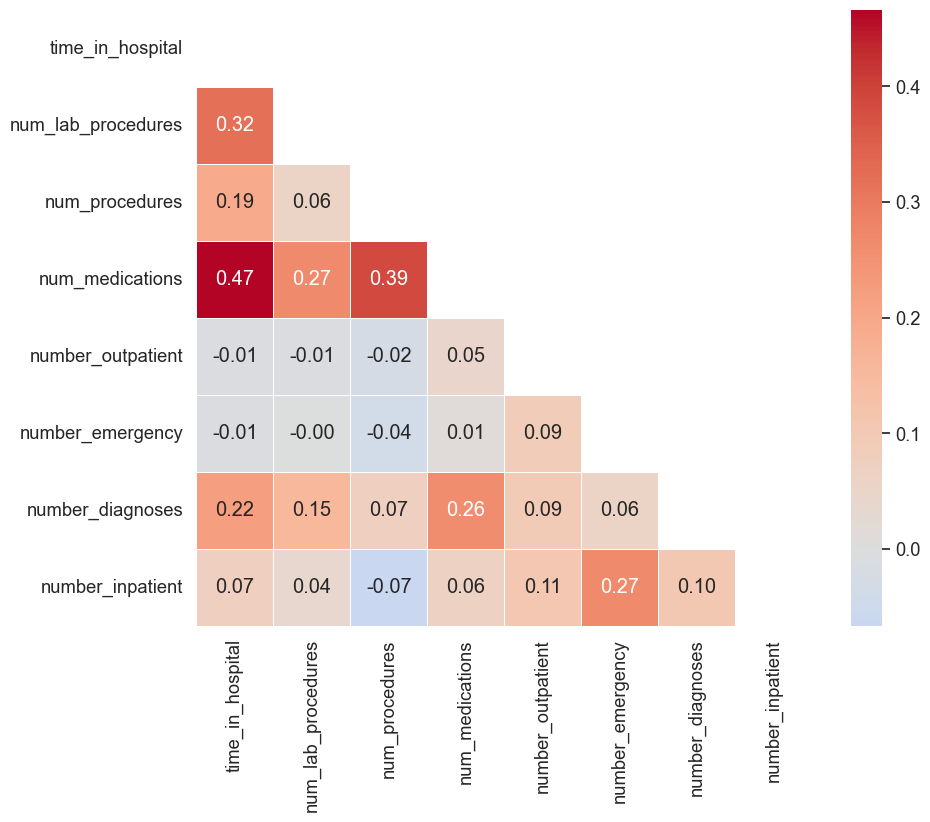

In [77]:
# calculate correlation matrix
corr_matrix = diabetes[numerical].corr()

# plot correlation matrix
sns.set(font_scale=1.2)
sns.set_style("white")
mask = np.zeros_like(corr_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0, square=True, linewidths=0.5)
plt.show()

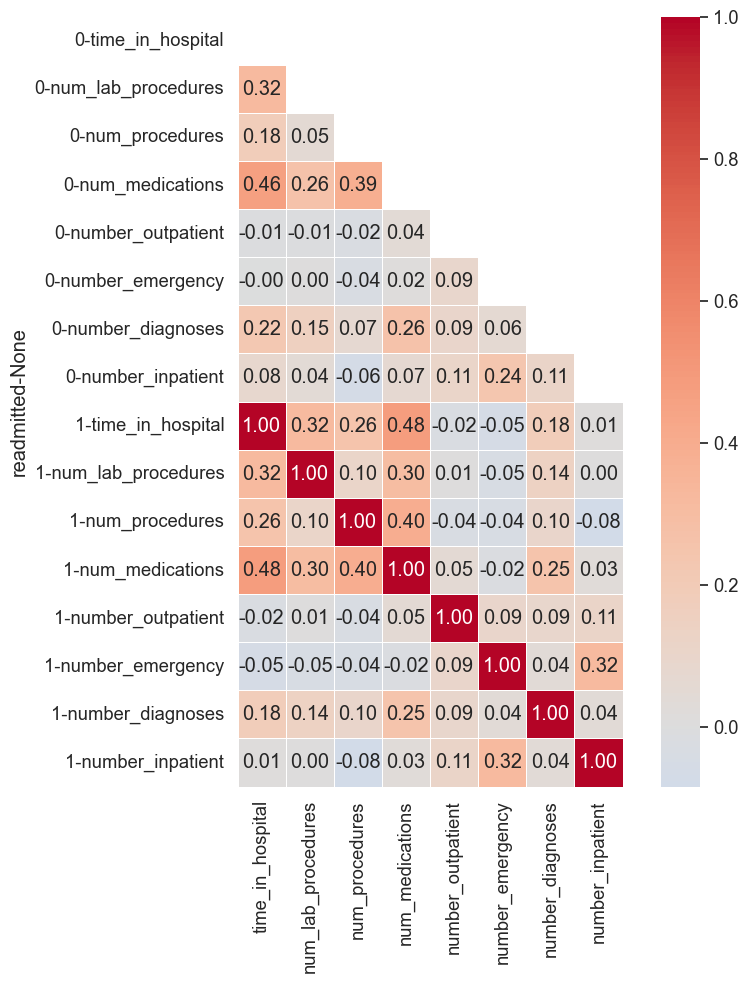

In [10]:
# calculate correlation matrix
corr_matrix = diabetes.groupby('readmitted')[numerical].corr()

# plot correlation matrix
sns.set(font_scale=1.2)
sns.set_style("white")
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0, square=True, linewidths=0.5)
plt.show()

## Categorical data

In [27]:
import pandas as pd
from sklearn.feature_selection import mutual_info_classif
from scipy.stats import pearsonr, chi2_contingency
from sklearn.impute import SimpleImputer
diabetes = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/cleandatav2.csv')

# Impute missing numerical values with the mean
num_imputer = SimpleImputer(strategy='mean')
numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures',
             'num_medications', 'number_outpatient', 'number_emergency',
             'number_diagnoses', 'number_inpatient']
diabetes[numerical] = num_imputer.fit_transform(diabetes[numerical])

# Impute missing categorical values with the mode
cat_imputer = SimpleImputer(strategy='most_frequent')
categorical = ['gender', 'age', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
               'max_glu_serum', 'A1Cresult', 'metformin', 'repaglinide', 'nateglinide',
               'chlorpropamide', 'glimepiride', 'glipizide', 'glyburide', 'tolbutamide',
               'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone', 'tolazamide',
               'insulin', 'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone',
               'change', 'diabetesMed']
diabetes[categorical] = cat_imputer.fit_transform(diabetes[categorical])

# Identify numerical variables that are strongly correlated with readmission
correlations = []
for var in numerical:
    corr, _ = pearsonr(diabetes[var], diabetes['readmitted'])
    correlations.append((var, corr))
correlations.sort(key=lambda x: abs(x[1]), reverse=True)
top_numerical = [c[0] for c in correlations[:3]]

# Identify categorical variables that are strongly associated with readmission
associations = []
for var in categorical:
    contingency = pd.crosstab(diabetes[var], diabetes['readmitted'])
    _, p, _, _ = chi2_contingency(contingency)
    associations.append((var, p))
associations.sort(key=lambda x: x[1])
top_categorical = [a[0] for a in associations[:3]]

# Combine the selected numerical and categorical variables into a single dataframe
features = top_numerical + top_categorical
X = diabetes[features]
y = diabetes['readmitted']

# Calculate feature importance scores using mutual information
importance_scores = mutual_info_classif(X, y)

# Create a dataframe of the selected features and their importance scores
results = pd.DataFrame({'feature': features, 'importance': importance_scores})
results = results.sort_values(by='importance', ascending=False)

# Print the results
print(results)

                    feature  importance
0          number_inpatient    0.011960
3  discharge_disposition_id    0.009703
5                       age    0.006156
2          number_diagnoses    0.005872
4                   insulin    0.004428
1          number_emergency    0.002868


In [28]:
import pandas as pd
from sklearn.feature_selection import mutual_info_classif
from scipy.stats import pearsonr, chi2_contingency
from sklearn.impute import SimpleImputer

diabetes = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/cleandatav2.csv')
diabetes = diabetes[diabetes['readmitted'] == 0]


# Identify numerical variables that are strongly correlated with readmission
correlations = []
for var in numerical:
    corr, _ = pearsonr(diabetes[var], diabetes['readmitted'] == 0)
    correlations.append((var, corr))
correlations.sort(key=lambda x: abs(x[1]), reverse=True)
top_numerical = [c[0] for c in correlations[:3]]

# Identify categorical variables that are strongly associated with readmission
associations = []
for var in categorical:
    contingency = pd.crosstab(diabetes[var], diabetes['readmitted'] == 0)
    _, p, _, _ = chi2_contingency(contingency)
    associations.append((var, p))
associations.sort(key=lambda x: x[1])
top_categorical = [a[0] for a in associations[:3]]

# Combine the selected numerical and categorical variables into a single dataframe
features = top_numerical + top_categorical
X = diabetes[features]
y = diabetes['readmitted'] == 0

# Calculate feature importance scores using mutual information
importance_scores = mutual_info_classif(X, y)

# Create a dataframe of the selected features and their importance scores
results = pd.DataFrame({'feature': features, 'importance': importance_scores})
results = results.sort_values(by='importance', ascending=False)

# Print the results
print(results)

              feature  importance
3              gender    0.010597
5   admission_type_id    0.005376
4                 age    0.004380
2      num_procedures    0.001974
0    time_in_hospital    0.001792
1  num_lab_procedures    0.000304


In [29]:
import pandas as pd
from sklearn.feature_selection import mutual_info_classif
from sklearn.impute import SimpleImputer

diabetes = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/cleandatav2.csv')
# Filter the dataset to include only readmitted patients
diabetes = diabetes[diabetes['readmitted'] == 1]


# Identify numerical variables that are strongly correlated with readmission
correlations = []
for var in numerical:
    corr, _ = pearsonr(diabetes[var], diabetes['readmitted'] == 1)
    correlations.append((var, corr))
correlations.sort(key=lambda x: abs(x[1]), reverse=True)
top_numerical = [c[0] for c in correlations[:3]]

# Identify categorical variables that are strongly associated with readmission
associations = []
for var in categorical:
    contingency = pd.crosstab(diabetes[var], diabetes['readmitted'] == 1)
    _, p, _, _ = chi2_contingency(contingency)
    associations.append((var, p))
associations.sort(key=lambda x: x[1])
top_categorical = [a[0] for a in associations[:3]]

# Combine the selected numerical and categorical variables into a single dataframe
features = top_numerical + top_categorical
X = diabetes[features]
y = diabetes['readmitted'] == 1 

# Calculate feature importance scores using mutual information
importance_scores = mutual_info_classif(X, y)

# Create a dataframe of the selected features and their importance scores
results = pd.DataFrame({'feature': features, 'importance': importance_scores})
results = results.sort_values(by='importance', ascending=False)

# Print the results
print(results)


              feature  importance
3              gender    0.001761
4                 age    0.000572
5   admission_type_id    0.000572
0    time_in_hospital    0.000220
1  num_lab_procedures    0.000088
2      num_procedures    0.000044
